In [2]:
%pylab inline
import matplotlib.pyplot as plt
import plotly.express as px
plt.style.use("bmh")
plt.rcParams["figure.figsize"] = (8,6)
plt.rcParams['axes.grid'] = True

Populating the interactive namespace from numpy and matplotlib


In [36]:
import numpy as np
import pandas as pd
import joblib
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler

In [4]:
from sklearn.metrics import mean_squared_error
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

In [5]:
data = pd.read_csv("strawberry/sensor_data.csv", index_col = 0)
data['date'] = pd.to_datetime(data['date'])
data.head()

,date,Температура воздуха,Относительная влажность почвы_p1,Освещенность_p1,Кислотность почвы_p1,Относительная влажность почвы_p2,Освещенность_p2,Кислотность почвы_p2,Относительная влажность почвы_p3,Освещенность_p3,Кислотность почвы_p3,Относительная влажность почвы_p4,Освещенность_p4,Кислотность почвы_p4,Относительная влажность почвы_p5,Освещенность_p5,Кислотность почвы_p5
0,2055-01-01 21:00:00,8.1,83.871171,9.372267,NaN,85.402235,5.730315,NaN,82.847866,0.593946,NaN,83.832183,7.302160,NaN,82.749298,11.082645,NaN
1,2055-01-01 18:00:00,7.0,75.796581,-0.746913,NaN,76.953745,3.082597,NaN,75.245512,-1.216491,NaN,78.301269,1.251600,NaN,77.201096,5.759567,NaN
2,2055-01-01 15:00:00,7.7,72.613395,53.036527,NaN,73.438229,48.870471,NaN,69.971412,48.821869,NaN,71.981326,43.728101,NaN,69.973813,45.683796,NaN
3,2055-01-01 12:00:00,8.0,65.166479,8.856843,NaN,65.576757,8.397043,NaN,64.811176,10.555363,NaN,63.750014,12.029423,NaN,65.956485,8.757718,NaN
4,2055-01-01 09:00:00,10.0,83.384661,6.571902,NaN,85.171630,9.688267,NaN,87.273131,5.914887,NaN,82.595904,3.701115,NaN,83.567264,8.267669,NaN


In [6]:
target = pd.read_csv("strawberry/harvest_yields.csv")
target.rename(columns={'Unnamed: 0': 'date'}, inplace=True)
target['date'] = pd.to_datetime(target['date'])
target

,date,Урожай
0,2052-03-31,7.1
1,2052-06-30,12.0
2,2052-09-30,10.0
3,2052-12-31,6.2
4,2053-03-31,7.5
5,2053-06-30,14.0
6,2053-09-30,12.3
7,2053-12-31,5.6
8,2054-03-31,4.9
9,2054-06-30,16.7


Добавление порядкового номера дня

In [10]:
data["День"] = range(0, data.shape[0], 1)
data["День"].loc[(data['date'] > "2052-04") & (data['date'] < "2052-07")] = range(0,data["День"].loc[(data['date'] > "2052-04") & (data['date'] < "2052-07")].shape[0], 1)
data["День"].loc[(data['date'] > "2052-07") & (data['date'] < "2052-10")] = range(0,data["День"].loc[(data['date'] > "2052-07") & (data['date'] < "2052-10")].shape[0], 1)
data["День"].loc[(data['date'] > "2052-10") & (data['date'] < "2053-01")] = range(0,data["День"].loc[(data['date'] > "2052-10") & (data['date'] < "2053-01")].shape[0], 1)
data["День"].loc[(data['date'] > "2053-01") & (data['date'] < "2053-04")] = range(0,data["День"].loc[(data['date'] > "2053-01") & (data['date'] < "2053-04")].shape[0], 1)
data["День"].loc[(data['date'] > "2053-04") & (data['date'] < "2053-07")] = range(0,data["День"].loc[(data['date'] > "2053-04") & (data['date'] < "2053-07")].shape[0], 1)
data["День"].loc[(data['date'] > "2053-07") & (data['date'] < "2053-10")] = range(0,data["День"].loc[(data['date'] > "2053-07") & (data['date'] < "2053-10")].shape[0], 1)
data["День"].loc[(data['date'] > "2053-10") & (data['date'] < "2054-01")] = range(0,data["День"].loc[(data['date'] > "2053-10") & (data['date'] < "2054-01")].shape[0], 1)
data["День"].loc[(data['date'] > "2054-01") & (data['date'] < "2054-04")] = range(0,data["День"].loc[(data['date'] > "2054-01") & (data['date'] < "2054-04")].shape[0], 1)
data["День"].loc[(data['date'] > "2054-04") & (data['date'] < "2054-07")] = range(0,data["День"].loc[(data['date'] > "2054-04") & (data['date'] < "2054-07")].shape[0], 1)
data["День"].loc[(data['date'] > "2054-07") & (data['date'] < "2054-10")] = range(0,data["День"].loc[(data['date'] > "2054-07") & (data['date'] < "2054-10")].shape[0], 1)
data["День"].loc[(data['date'] > "2054-10") & (data['date'] < "2055-01")] = range(0,data["День"].loc[(data['date'] > "2054-10") & (data['date'] < "2055-01")].shape[0], 1)
#data

Добавление номера сбора урожая

In [18]:
data["Урожай"] = 0
data["Урожай"].loc[(data['date'] > "2052-04") & (data['date'] < "2052-07")] = 1
data["Урожай"].loc[(data['date'] > "2052-07") & (data['date'] < "2052-10")] = 2
data["Урожай"].loc[(data['date'] > "2052-10") & (data['date'] < "2053-01")] = 3
data["Урожай"].loc[(data['date'] > "2053-01") & (data['date'] < "2053-04")] = 4
data["Урожай"].loc[(data['date'] > "2053-04") & (data['date'] < "2053-07")] = 5
data["Урожай"].loc[(data['date'] > "2053-07") & (data['date'] < "2053-10")] = 6
data["Урожай"].loc[(data['date'] > "2053-10") & (data['date'] < "2054-01")] = 7
data["Урожай"].loc[(data['date'] > "2054-01") & (data['date'] < "2054-04")] = 8
data["Урожай"].loc[(data['date'] > "2054-04") & (data['date'] < "2054-07")] = 9
data["Урожай"].loc[(data['date'] > "2054-07") & (data['date'] < "2054-10")] = 10
data["Урожай"].loc[(data['date'] > "2054-10") & (data['date'] < "2055-01")] = 11

Добавление значения урожайности

In [19]:
data["Урожайность"] = 7.1
data["Урожайность"].loc[(data['date'] > "2052-04") & (data['date'] < "2052-07")] = 12.0
data["Урожайность"].loc[(data['date'] > "2052-07") & (data['date'] < "2052-10")] = 10.0
data["Урожайность"].loc[(data['date'] > "2052-10") & (data['date'] < "2053-01")] = 6.2
data["Урожайность"].loc[(data['date'] > "2053-01") & (data['date'] < "2053-04")] = 7.5
data["Урожайность"].loc[(data['date'] > "2053-04") & (data['date'] < "2053-07")] = 14.0
data["Урожайность"].loc[(data['date'] > "2053-07") & (data['date'] < "2053-10")] = 12.3
data["Урожайность"].loc[(data['date'] > "2053-10") & (data['date'] < "2054-01")] = 5.6
data["Урожайность"].loc[(data['date'] > "2054-01") & (data['date'] < "2054-04")] = 4.9
data["Урожайность"].loc[(data['date'] > "2054-04") & (data['date'] < "2054-07")] = 16.7
data["Урожайность"].loc[(data['date'] > "2054-07") & (data['date'] < "2054-10")] = 9.4
data["Урожайность"].loc[(data['date'] > "2054-10") & (data['date'] < "2055-01")] = 13.7

Построение графиков

In [20]:
df = data

In [21]:
fig = px.line(df, x="День", y='Температура воздуха', animation_frame="Урожай", hover_name="Урожайность",
              category_orders={"Урожай": [0,1,2,3,4,5,6,7,8,9,10,11]},
               log_x=False, range_x=[0, 725], range_y=[-20,50])
fig.update_xaxes(title_text='День')
fig.update_yaxes(title_text='Температура')
fig.show()
fig.write_html("temperature.html")

In [22]:
y_m = ['Относительная влажность почвы_p1', 'Относительная влажность почвы_p2', 'Относительная влажность почвы_p3',
      'Относительная влажность почвы_p4', 'Относительная влажность почвы_p5',]
fig = px.line(df, x="День", y=y_m, hover_name="Урожайность", animation_frame = "Урожай",
              category_orders={"Урожай": [0,1,2,3,4,5,6,7,8,9,10,11]},
              log_x=False, range_x=[0, 725], range_y=[10, 110])
fig.update_xaxes(title_text='День')
fig.update_yaxes(title_text='Влажность почвы')
fig.show()
fig.write_html("moisture.html")

In [23]:
y_m = ['Освещенность_p1', 'Освещенность_p2', 'Освещенность_p3',
      'Освещенность_p4', 'Освещенность_p5',]
fig = px.line(df, x="День", y=y_m, animation_frame="Урожай", 
              category_orders={"Урожай": [0,1,2,3,4,5,6,7,8,9,10,11]},
              log_x=False, range_x=[0, 725], range_y=[-10, 110])
fig.update_xaxes(title_text='День')
fig.update_yaxes(title_text='Освещенность')
fig.show()
fig.write_html("lighting.html")

In [24]:
y_m = ['Кислотность почвы_p1', 'Кислотность почвы_p2', 'Кислотность почвы_p3',
      'Кислотность почвы_p4', 'Кислотность почвы_p5',]
fig = px.line(df, x="День", y=y_m, animation_frame="Урожай", 
              category_orders={"Урожай": [0,1,2,3,4,5,6,7,8,9,10,11]},
              log_x=False, range_x=[0, 725], range_y=[5, 9])
fig.update_xaxes(title_text='День')
fig.update_yaxes(title_text='Кислотность почвы')
fig.show()
fig.write_html("acidity.html")

Добавление сезона

In [25]:
data["month"] = data['date'].dt.month
data["season"] = 'spring'
data["season"] = np.where((data["month"] >= 4) & (data["month"] <= 6), 'summer', data["season"])
data["season"] = np.where((data["month"] >= 7) & (data["month"] <= 9), 'autumn', data["season"])
data["season"] = np.where((data["month"] >= 10) & (data["month"] <= 12), 'winter', data["season"])
data

,date,Температура воздуха,Относительная влажность почвы_p1,Освещенность_p1,Кислотность почвы_p1,Относительная влажность почвы_p2,Освещенность_p2,Кислотность почвы_p2,Относительная влажность почвы_p3,Освещенность_p3,...,Освещенность_p4,Кислотность почвы_p4,Относительная влажность почвы_p5,Освещенность_p5,Кислотность почвы_p5,День,Урожай,Урожайность,month,season
0,2055-01-01 21:00:00,8.1,83.871171,9.372267,NaN,85.402235,5.730315,NaN,82.847866,0.593946,...,7.302160,NaN,82.749298,11.082645,NaN,0,0,7.1,1,spring
1,2055-01-01 18:00:00,7.0,75.796581,-0.746913,NaN,76.953745,3.082597,NaN,75.245512,-1.216491,...,1.251600,NaN,77.201096,5.759567,NaN,1,0,7.1,1,spring
2,2055-01-01 15:00:00,7.7,72.613395,53.036527,NaN,73.438229,48.870471,NaN,69.971412,48.821869,...,43.728101,NaN,69.973813,45.683796,NaN,2,0,7.1,1,spring
3,2055-01-01 12:00:00,8.0,65.166479,8.856843,NaN,65.576757,8.397043,NaN,64.811176,10.555363,...,12.029423,NaN,65.956485,8.757718,NaN,3,0,7.1,1,spring
4,2055-01-01 09:00:00,10.0,83.384661,6.571902,NaN,85.171630,9.688267,NaN,87.273131,5.914887,...,3.701115,NaN,83.567264,8.267669,NaN,4,0,7.1,1,spring
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8762,2052-01-01 12:00:00,11.9,94.599833,9.934135,7.202713,96.083500,2.875814,NaN,94.756075,-1.928082,...,1.620365,NaN,NaN,-1.668564,6.685177,8762,0,7.1,1,spring
8763,2052-01-01 09:00:00,11.6,94.625269,9.359896,7.935569,95.187210,1.342752,NaN,95.477356,9.528366,...,2.595690,NaN,NaN,6.890386,6.995560,8763,0,7.1,1,spring
8764,2052-01-01 06:00:00,11.3,97.591535,4.706175,6.843585,95.681661,10.468263,NaN,95.219937,1.261181,...,11.669676,NaN,NaN,8.127634,7.442175,8764,0,7.1,1,spring
8765,2052-01-01 03:00:00,11.3,98.388953,-0.973886,7.431705,94.040565,2.696872,NaN,97.299356,8.184974,...,6.925254,NaN,NaN,9.275594,7.462803,8765,0,7.1,1,spring


In [26]:
data["Урожай"][data["Урожай"] == 11].count()

734

## Построение модели прогнозирования

In [27]:
#первый урожай 7.1
data1 = data.loc[(data['date'] < "2052-04")]
#второй урожай 12.0
data2 = data.loc[(data['date'] > "2052-04") & (data['date'] < "2052-07")]
#третий урожай 10.0
data3 = data.loc[(data['date'] > "2052-07") & (data['date'] < "2052-10")]
#четвертый урожай 6.2
data4 = data.loc[(data['date'] > "2052-10") & (data['date'] < "2053-01")]
#пятый урожай 7.5
data5 = data.loc[(data['date'] > "2053-01") & (data['date'] < "2053-04")]
#шестой урожай 14.0
data6 = data.loc[(data['date'] > "2053-04") & (data['date'] < "2053-07")]
#седьмой урожай 12.3
data7 = data.loc[(data['date'] > "2053-07") & (data['date'] < "2053-10")]
#восьмой урожай 5.6
data8 = data.loc[(data['date'] > "2053-10") & (data['date'] < "2054-01")]
#девятый урожай 4.9
data9 = data.loc[(data['date'] > "2054-01") & (data['date'] < "2054-04")]
#десятый урожай 16.7
data10 = data.loc[(data['date'] > "2054-04") & (data['date'] < "2054-07")]
#одиннадцатый урожай 9.4
data11 = data.loc[(data['date'] > "2054-07") & (data['date'] < "2054-10")]
#двенадцатый урожай 13.7
data12 = data.loc[(data['date'] > "2054-10") & (data['date'] < "2055-01")]

In [28]:
#новые (частично)
data13 = data.loc[(data['date'] > "2055-01")]

In [29]:
# медианные значения для прогнозирования
med = ['Температура воздуха', 'Относительная влажность почвы_p1', 'Освещенность_p1', 'Кислотность почвы_p1', 
       'Относительная влажность почвы_p2', 'Освещенность_p2', 'Кислотность почвы_p2', 
       'Относительная влажность почвы_p3', 'Освещенность_p3', 'Кислотность почвы_p3', 
       'Относительная влажность почвы_p4', 'Освещенность_p4', 'Кислотность почвы_p4', 
       'Относительная влажность почвы_p5', 'Освещенность_p5', 'Кислотность почвы_p5']
#data1[med].median()

In [30]:
#Сведение медианных значений в одну таблицу
temp1 = pd.concat([data1[med].median(), data2[med].median(), data3[med].median(), data4[med].median(), 
           data5[med].median(), data6[med].median(), data7[med].median(), data8[med].median(), 
           data9[med].median(), data10[med].median(), data11[med].median(), data12[med].median()], axis=1)
temp1.T

,Температура воздуха,Относительная влажность почвы_p1,Освещенность_p1,Кислотность почвы_p1,Относительная влажность почвы_p2,Освещенность_p2,Кислотность почвы_p2,Относительная влажность почвы_p3,Освещенность_p3,Кислотность почвы_p3,Относительная влажность почвы_p4,Освещенность_p4,Кислотность почвы_p4,Относительная влажность почвы_p5,Освещенность_p5,Кислотность почвы_p5
0,8.45,81.108603,10.018930,6.994599,81.192869,9.764531,7.049718,81.294588,9.488539,6.997871,81.893938,9.491831,6.972057,81.100771,8.893583,6.980195
1,20.30,67.306949,15.924392,7.057839,65.270519,15.052936,6.996873,68.281981,15.116208,6.969012,66.872543,18.090366,6.945426,66.847557,14.942707,7.004174
2,26.40,74.993963,22.847949,6.886033,75.168151,23.079825,6.971804,75.617859,25.211615,6.851813,75.007750,20.684758,6.898411,75.182396,22.131914,7.057744
3,11.20,87.206521,5.750703,6.943186,86.959260,6.442477,6.959649,87.175681,6.112431,7.084620,86.897545,6.049762,6.969364,86.925556,6.410842,6.954614
4,4.00,78.651420,9.687613,7.110219,77.447007,9.772543,7.090952,71.465347,9.367314,7.138268,79.838496,10.941697,7.116683,80.196946,10.722641,7.115708
5,23.80,58.143070,27.867911,7.017685,57.476849,29.469178,6.981431,57.554095,33.461998,7.119681,57.906405,32.580289,7.071507,57.597315,34.365453,7.032672
6,28.50,69.314469,30.446215,6.956434,71.748257,34.213139,6.976468,71.210700,42.889872,6.917381,71.537696,31.399679,6.932299,71.615834,30.809295,6.959680
7,9.90,84.731440,8.221278,7.028428,85.165272,9.785876,7.070982,85.389679,8.741090,7.018585,84.981313,8.372610,7.001454,85.524746,8.952585,7.003078
8,8.10,83.183907,7.963487,6.983051,83.184474,7.747439,6.942737,83.617983,8.130558,7.067236,82.930121,8.271734,7.040026,83.481628,8.247303,7.069550
9,25.10,52.585167,33.995000,6.937053,54.776178,31.513775,6.967952,53.047393,36.596631,6.935243,55.372654,29.944291,6.976164,54.845783,34.082557,7.031268


## Поиск аномалий

In [33]:
# Влиянеи сезона
temp = pd.concat([target, temp1.T], axis=1)
temp['season'] = [4,1,2,3,4,1,2,3,4,1,2,3]
#temp

In [34]:
#Заморозки
t0 = data1['Температура воздуха'][data1['Температура воздуха']<0].count()
t1 = data2['Температура воздуха'][data2['Температура воздуха']<0].count()
t2 = data3['Температура воздуха'][data3['Температура воздуха']<0].count()
t3 = data4['Температура воздуха'][data4['Температура воздуха']<0].count()
t4 = data5['Температура воздуха'][data5['Температура воздуха']<0].count()
t5 = data6['Температура воздуха'][data6['Температура воздуха']<0].count()
t6 = data7['Температура воздуха'][data7['Температура воздуха']<0].count()
t7 = data8['Температура воздуха'][data8['Температура воздуха']<0].count()
t8 = data9['Температура воздуха'][data9['Температура воздуха']<0].count()
t9 = data10['Температура воздуха'][data10['Температура воздуха']<0].count()
t10 = data11['Температура воздуха'][data11['Температура воздуха']<0].count()
t11 = data12['Температура воздуха'][data12['Температура воздуха']<0].count()
temp['заморозки'] = [t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11]
#temp

In [35]:
# Искусственное освещение
t0 = data1['Освещенность_p3'][data1['Освещенность_p3']>13].count()
t1 = data2['Освещенность_p3'][data2['Освещенность_p3']>13].count()
t2 = data3['Освещенность_p3'][data3['Освещенность_p3']>13].count()
t3 = data4['Освещенность_p3'][data4['Освещенность_p3']>13].count()
t4 = data5['Освещенность_p3'][data5['Освещенность_p3']>13].count()
t5 = data6['Освещенность_p3'][data6['Освещенность_p3']>13].count()
t6 = data7['Освещенность_p3'][data7['Освещенность_p3']>13].count()
t7 = data8['Освещенность_p3'][data8['Освещенность_p3']>13].count()
t8 = data9['Освещенность_p3'][data9['Освещенность_p3']>13].count()
t9 = data10['Освещенность_p3'][data10['Освещенность_p3']>13].count()
t10 = data11['Освещенность_p3'][data11['Освещенность_p3']>13].count()
t11 = data12['Освещенность_p3'][data12['Освещенность_p3']>13].count()
temp['Освещение'] = [t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11]
#temp

In [51]:
temp[['Урожай', 'Температура воздуха', 'season', 'заморозки', 'Освещение']]

,Урожай,Температура воздуха,season,заморозки,Освещение
0,7.1,8.45,4,110,264
1,12.0,20.30,1,0,371
2,10.0,26.40,2,0,412
3,6.2,11.20,3,0,60
4,7.5,4.00,4,144,278
5,14.0,23.80,1,0,513
6,12.3,28.50,2,0,454
7,5.6,9.90,3,40,239
8,4.9,8.10,4,63,184
9,16.7,25.10,1,0,453


In [39]:
pred_col = ['Температура воздуха', 'Относительная влажность почвы_p1', 'Освещенность_p1', 'Кислотность почвы_p1', 
       'Относительная влажность почвы_p2', 'Освещенность_p2', 'Кислотность почвы_p2', 
       'Относительная влажность почвы_p3', 'Освещенность_p3', 'Кислотность почвы_p3', 
       'Относительная влажность почвы_p4', 'Освещенность_p4', 'Кислотность почвы_p4', 
       'Относительная влажность почвы_p5', 'Освещенность_p5', 'Кислотность почвы_p5', 
       'season', 'заморозки', 'Освещение']

In [40]:
scaler = StandardScaler()
ridge = Ridge(alpha=0.01, normalize = True, random_state=42)

In [41]:
scaler.fit(temp[pred_col])
train = scaler.transform(temp[pred_col])
ridge.fit(train, temp['Урожай'])
ridge_valid_pred = ridge.predict(train)

In [42]:
rmse(temp['Урожай'], ridge_valid_pred)

0.4292432799493601

Text(0.5, 1.0, 'Урожайность')

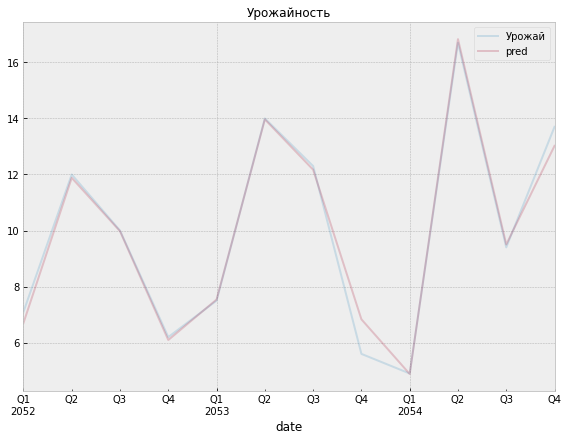

In [43]:
# точность прогнозирования
temp['pred'] = ridge_valid_pred
temp.plot(x='date', y=['Урожай', 'pred'], alpha=0.2)
plt.legend(loc=0)
plt.tight_layout()
plt.title("Урожайность", fontsize=12)

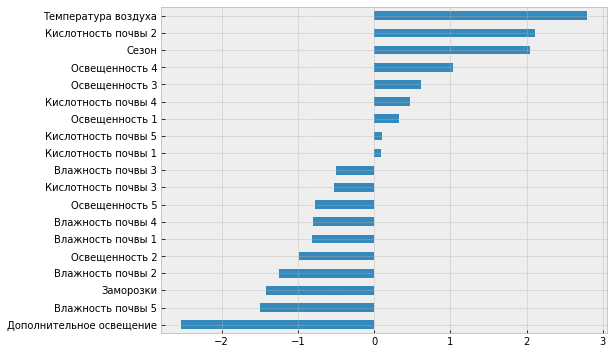

In [44]:
# ваность парамтеров для прогнозирования
col_name = ['Температура воздуха', 
            'Влажность почвы 1', 'Освещенность 1', 'Кислотность почвы 1', 
            'Влажность почвы 2', 'Освещенность 2', 'Кислотность почвы 2',
            'Влажность почвы 3', 'Освещенность 3', 'Кислотность почвы 3',
            'Влажность почвы 4', 'Освещенность 4', 'Кислотность почвы 4',
            'Влажность почвы 5', 'Освещенность 5', 'Кислотность почвы 5',
            'Сезон', 'Заморозки', 'Дополнительное освещение']
ft_impotans = pd.Series(ridge.coef_, index = col_name)
ft_impotans.sort_values(ascending=True, inplace = True)
ft_impotans.plot(kind = "barh")

In [45]:
ft_impotans

Дополнительное освещение   -2.532280
Влажность почвы 5          -1.499754
Заморозки                  -1.422857
Влажность почвы 2          -1.247244
Освещенность 2             -0.987403
Влажность почвы 1          -0.813556
Влажность почвы 4          -0.797687
Освещенность 5             -0.769566
Кислотность почвы 3        -0.521947
Влажность почвы 3          -0.501496
Кислотность почвы 1         0.095783
Кислотность почвы 5         0.100945
Освещенность 1              0.332551
Кислотность почвы 4         0.476621
Освещенность 3              0.614734
Освещенность 4              1.028979
Сезон                       2.039633
Кислотность почвы 2         2.115151
Температура воздуха         2.789675
dtype: float64

In [46]:
#Сохранение результатов TfidfVectorizer
joblib.dump(ridge, 'ridge.pkl') 

# load model
#ridge = joblib.load('ridge.pkl') 

['ridge.pkl']

In [218]:
new = data13[med].median()
new

Температура воздуха                  8.100000
Относительная влажность почвы_p1    83.384661
Освещенность_p1                      7.140262
Кислотность почвы_p1                      NaN
Относительная влажность почвы_p2    85.171630
Освещенность_p2                      9.229714
Кислотность почвы_p2                      NaN
Относительная влажность почвы_p3    82.847866
Освещенность_p3                      4.286965
Кислотность почвы_p3                      NaN
Относительная влажность почвы_p4    82.595904
Освещенность_p4                      7.302160
Кислотность почвы_p4                      NaN
Относительная влажность почвы_p5    82.749298
Освещенность_p5                      8.757718
Кислотность почвы_p5                      NaN
dtype: float64

In [303]:
test_ = np.array([8.0, 50.0, 20.0, 7.5, 50.0, 20.0, 7.5, 50.0, 20.0,  7.5, 
                  50.0, 20.0, 7.5, 50.0, 20.0, 7.5, 4, 0, 0])

In [304]:
test = scaler.transform(test_.reshape(1, -1))
ridge_pred = ridge.predict(test)
ridge_pred

array([48.92206598])